# Model visualization

**Import** model from "model/v01"

In [1]:
# Setup

import pandas as pd
import seaborn as sns

from src import utils
from src import plot

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.cluster import KMeans


In [5]:
# Configurations

run_save = True
final_version = True

n_clusters = 3   # None to do not run
plot_pca = True
plot_tsne = True

seed = 123

In [6]:
# Importing data

parent = 'data'
filename = 'cleaned.csv'

path = utils.get_path(parent,filename)
df = pd.read_csv(path)


parent = 'data'
filename = 'amino.csv'

path = utils.get_path(parent,filename)
amino_df = pd.read_csv(path)

In [7]:
numericals = df.select_dtypes(include=['number'])
numericals = numericals.columns

categoricals = df.select_dtypes(exclude=['number'])
categoricals = categoricals.columns

codons = numericals[4:]

print(codons)

df[codons].shape

Index(['UUU', 'UUC', 'UUA', 'UUG', 'CUU', 'CUC', 'CUA', 'CUG', 'AUU', 'AUC',
       'AUA', 'AUG', 'GUU', 'GUC', 'GUA', 'GUG', 'GCU', 'GCC', 'GCA', 'GCG',
       'CCU', 'CCC', 'CCA', 'CCG', 'UGG', 'GGU', 'GGC', 'GGA', 'GGG', 'UCU',
       'UCC', 'UCA', 'UCG', 'AGU', 'AGC', 'ACU', 'ACC', 'ACA', 'ACG', 'UAU',
       'UAC', 'CAA', 'CAG', 'AAU', 'AAC', 'UGU', 'UGC', 'CAU', 'CAC', 'AAA',
       'AAG', 'CGU', 'CGC', 'CGA', 'CGG', 'AGA', 'AGG', 'GAU', 'GAC', 'GAA',
       'GAG', 'UAA', 'UAG', 'UGA'],
      dtype='object')


(13028, 64)

/home/tonso/code/97_history/codons/venv/lib/python3.10/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but KMeans was fitted without feature names
  warnings.warn(


figure saved on  /home/tonso/code/97_history/codons/reports/3d_pca_cluster


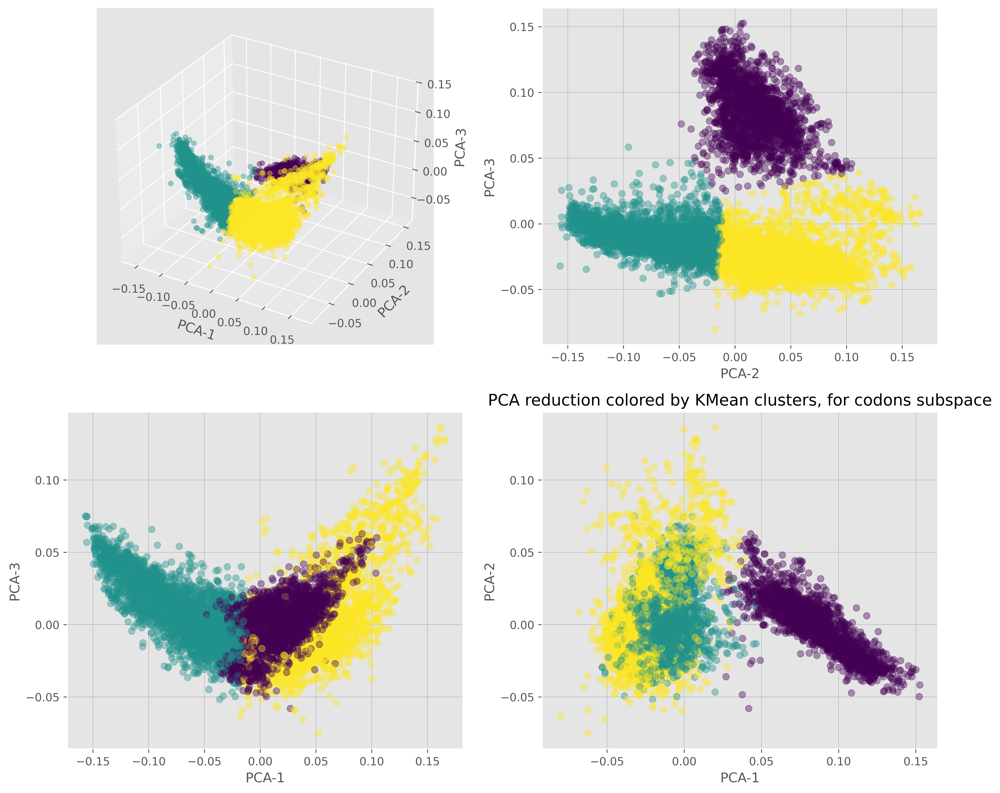

figure saved on  /home/tonso/code/97_history/codons/reports/t_sne_cluster


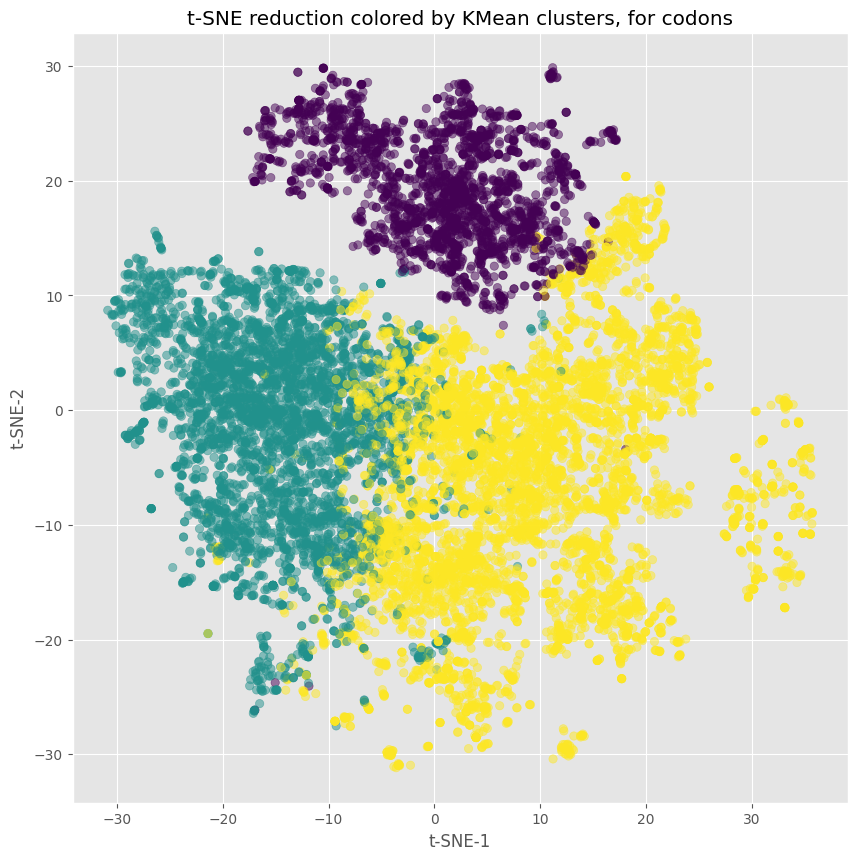

'    if plot_pca and plot_tsne:\n        figure,axes = plt.figure(figsize=(20,10))\n        \n        ax1 = figure.add_subplot(222)\n        ax2 = figure.add_subplot(223)\n        ax1 = pca_3d\n        ax2 = tsne\n        plt.show()'

In [8]:

if n_clusters:

    X = df[codons]
    X_norm = preprocessing.normalize(X)
    
    kmeans = KMeans(n_clusters=n_clusters, random_state=seed, n_init='auto')
    kmeans.fit(X_norm)
    kmeans_pred = kmeans.predict(X)

    if plot_pca:
        name = '3d_pca_cluster' if run_save else None
        pca_3d = plot.pca_3d(X, hue=kmeans.labels_, 
                             final_version=final_version,
                             title="PCA reduction colored by KMean clusters, for codons subspace" , 
                             multiple_graph=True, savename=name)

    if plot_tsne:
        name = 't_sne_cluster' if run_save else None
        tsne = plot.t_sne(X, hue=kmeans.labels_, 
                          final_version=final_version,
                          title="t-SNE reduction colored by KMean clusters, for codons", 
                          savename=name)



figure saved on  /home/tonso/code/97_history/codons/reports/3d_pca-codons


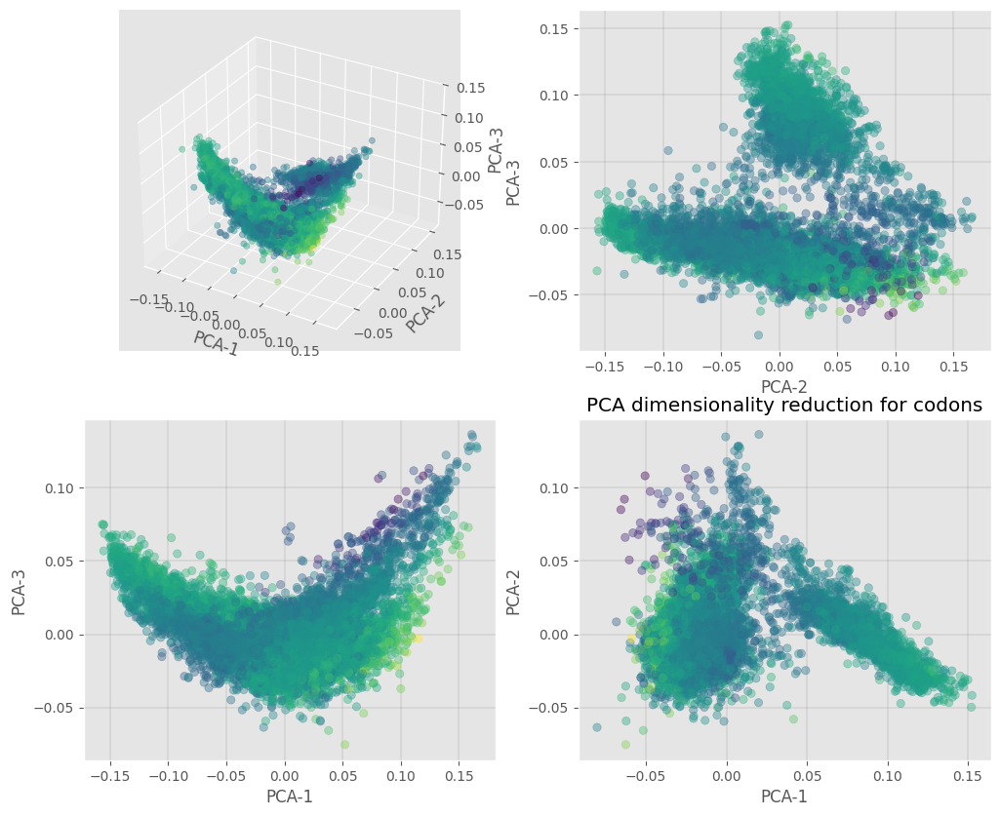

In [9]:
if plot_pca:
    name = '3d_pca-codons' if run_save else None
    plot.pca_3d(df[codons], title="PCA dimensionality reduction for codons" , multiple_graph=True, savename=name)


In [10]:
print(df.shape[0])
print(kmeans_pred.size)

13028
13028


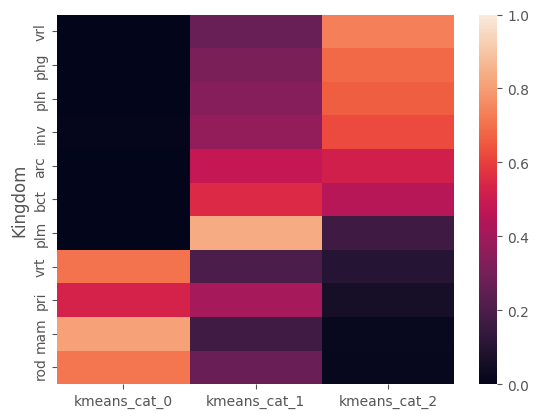

In [11]:
# KMeans vs Kingdons

kingdom_codons = [df.columns[1]] # + list(df.columns[7:])
k_king_df = df[kingdom_codons].copy()

# k_king_df = k_king_df.drop(columns="SpeciesName")

k_king_df['kmeans_cat'] = kmeans_pred
k_king_df = pd.get_dummies(k_king_df, columns=['kmeans_cat'], drop_first=False)


grouped_df = k_king_df.groupby("Kingdom").mean()


grouped_df = grouped_df.sort_values(by='kmeans_cat_0', ascending=False)
grouped_df = grouped_df.sort_values(by='kmeans_cat_1', ascending=True)
grouped_df = grouped_df.sort_values(by='kmeans_cat_2', ascending=False)


grouped_df.tail()

kkingdom = sns.heatmap(grouped_df, vmin=0, vmax=1)
fig = kkingdom.get_figure()

parent = 'reports'
filename= 'kingdom_kmean.png'

path = utils.get_path(parent=parent,filename=filename)
fig.savefig(path)

# grouped_df.apply(pd.DataFrame.describe, axis=1)